In [35]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

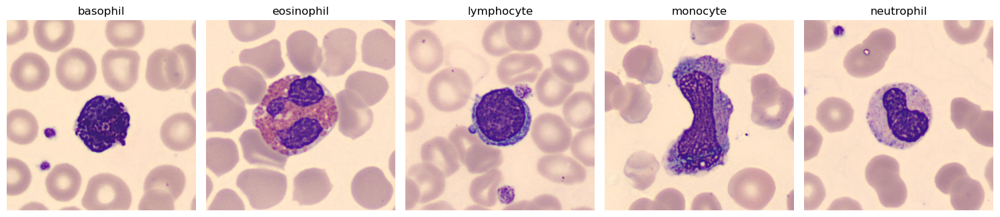

In [36]:
def display_sample_images(dataset_path):
   
    if not os.path.exists(dataset_path):
        print(f"Error: Dataset path {dataset_path} tidak ditemukan!")
        return
    
    folders = [f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))]
    image_paths = []

    # Ambil satu gambar pertama dari setiap folder
    for folder in folders:
        folder_path = os.path.join(dataset_path, folder)
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
        
        if image_files:
            image_paths.append((folder, os.path.join(folder_path, image_files[0])))

    # Menampilkan gambar secara horizontal
    num_images = len(image_paths)
    if num_images == 0:
        print("Tidak ada gambar yang ditemukan dalam dataset.")
        return
    
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 3, 5))  # Atur ukuran horizontal
    
    if num_images == 1:
        axes = [axes]  # Jika hanya ada 1 gambar, ubah agar tetap bisa diakses dengan loop
    
    for ax, (folder_name, img_path) in zip(axes, image_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(folder_name)
        ax.axis("off")

    plt.tight_layout()
    plt.show()
# Contoh penggunaan
DATASET_PATH = "./segmented_dataset"  # Ganti dengan path dataset Anda
display_sample_images(DATASET_PATH)


In [37]:
def segment_blood_cell(img_path):
   
    # Load image
    image = cv2.imread(img_path)
    if image is None:
        print(f"Error: Could not read the image at {img_path}")
        return None

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Step 1: Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Step 2: Apply Canny Edge Detection
    edges = cv2.Canny(gray, 30, 120)
    
    # Morphological Operations 
    kernel_2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
    # Step 3: Dilasi Strel 2 piksel
    dilated_2 = cv2.dilate(edges, kernel_2, iterations=1)
    
    # Step 4: Erosi Strel 2 piksel
    eroded_2 = cv2.erode(dilated_2, kernel_2, iterations=1)
    
    # Step 5: Filling Holes
    filled = ndimage.binary_fill_holes(eroded_2).astype(np.uint8) * 255
    
    # Penambahan Morphological Processing
    kernel_7 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    # Step 6: Erosi Strel 7 piksel
    eroded_7 = cv2.erode(filled, kernel_7, iterations=1)
    
    kernel_6 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (6, 6))
    # Step 7: Erosi Strel 6 piksel
    dilated_6 = cv2.dilate(eroded_7, kernel_6, iterations=1)
    
    # Step 8: Remove small objects (< 150 pixels)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(dilated_6, connectivity=8)
    mask = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, num_labels):  # Ignore background (label 0)
        if stats[i, cv2.CC_STAT_AREA] >= 150:
            mask[labels == i] = 255
    
    # Step 6: Final Segmentation Overlay
    segmentation_mask = np.zeros_like(image)
    segmentation_mask[mask > 0] = [255, 0, 0]  # Red highlight for better visibility
    final_result = cv2.addWeighted(image, 0.7, segmentation_mask, 0.4, 0)
    
    # Display results horizontally
    plt.figure(figsize=(24, 4))
    
    # Add small spacing between subplots for better visualization
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    
    # Create the horizontal layout
    plt.subplot(1, 8, 1); plt.imshow(image_rgb); plt.title("Original"); plt.axis("off")
    plt.subplot(1, 8, 2); plt.imshow(edges, cmap='gray'); plt.title("Canny Edges"); plt.axis("off")
    plt.subplot(1, 8, 3); plt.imshow(dilated_2, cmap='gray'); plt.title("Dilated (2px)"); plt.axis("off")
    plt.subplot(1, 8, 4); plt.imshow(eroded_2, cmap='gray'); plt.title("Eroded (2px)"); plt.axis("off")
    plt.subplot(1, 8, 5); plt.imshow(filled, cmap='gray'); plt.title("Filled Holes"); plt.axis("off")
    plt.subplot(1, 8, 6); plt.imshow(dilated_6, cmap='gray'); plt.title("Dilated (6px)"); plt.axis("off")
    plt.subplot(1, 8, 6); plt.imshow(eroded_7, cmap='gray'); plt.title("Erodet (7px)"); plt.axis("off")
    plt.subplot(1, 8, 7); plt.imshow(mask, cmap='gray'); plt.title("Cleaned"); plt.axis("off")
    plt.subplot(1, 8, 8); plt.imshow(final_result, cmap='gray'); plt.title("Final Result"); plt.axis("off")
    
    plt.tight_layout()
    plt.show()

    return mask



In [38]:
def process_dataset(dataset_path):
    if not os.path.exists(dataset_path):
        print(f"Error: Dataset path {dataset_path} does not exist")
        return
    
    for folder in os.listdir(dataset_path):
        folder_path = os.path.join(dataset_path, folder)
        
        if os.path.isdir(folder_path):
            print(f"📌 Processing folder: {folder}")
            
            # Get all image files in the folder
            image_files = [f for f in os.listdir(folder_path) 
                          if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
            
            if len(image_files) > 0:
                # Process all images in folder
                for img_file in image_files:
                    img_path = os.path.join(folder_path, img_file)
                    segment_blood_cell(img_path)

📌 Processing folder: basophil


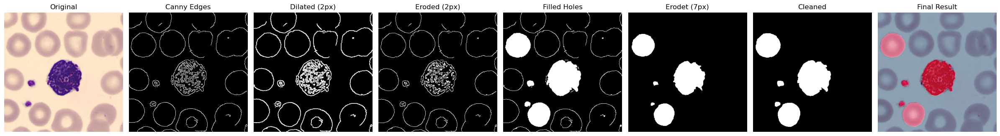

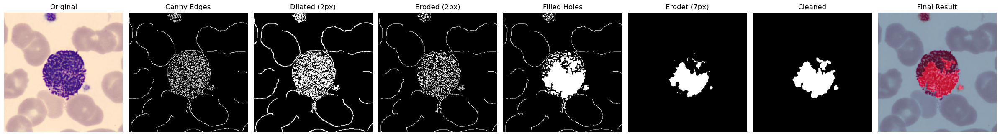

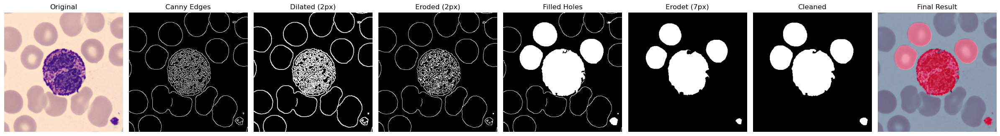

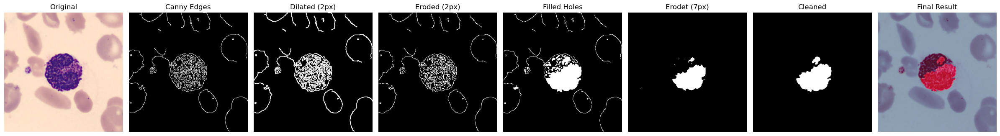

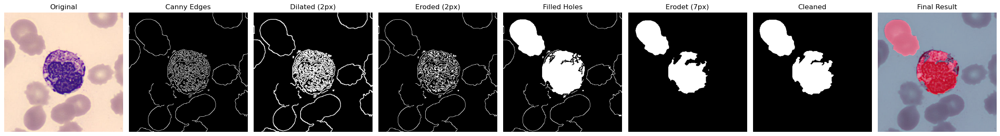

📌 Processing folder: eosinophil


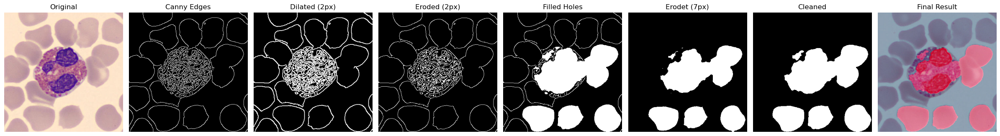

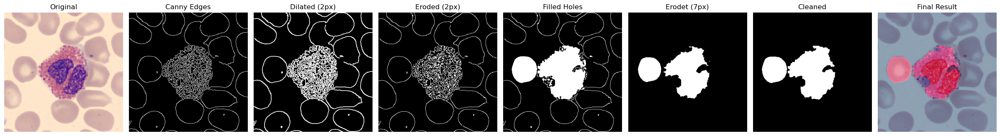

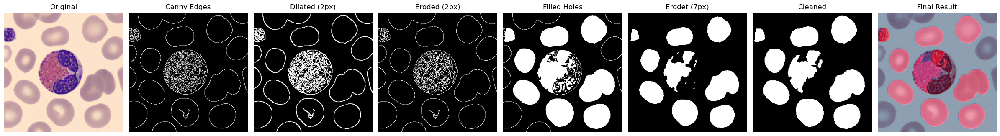

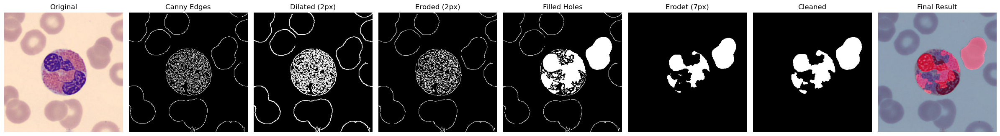

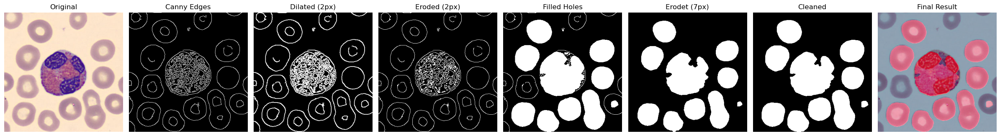

📌 Processing folder: lymphocyte


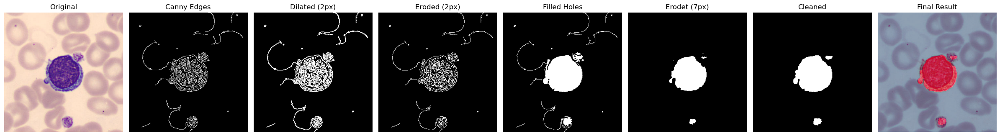

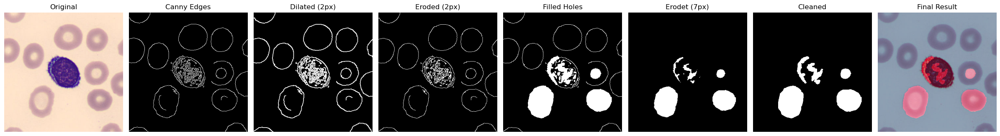

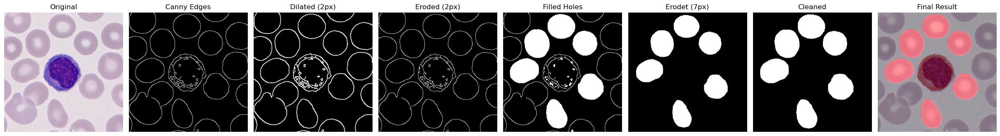

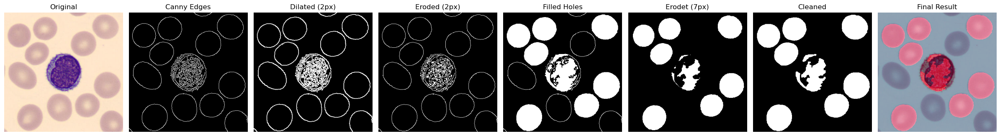

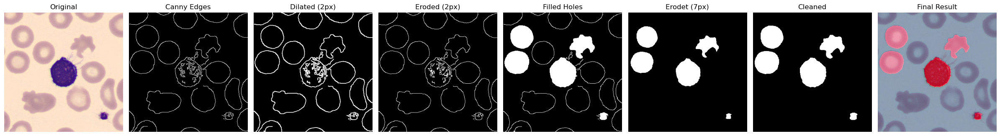

📌 Processing folder: monocyte


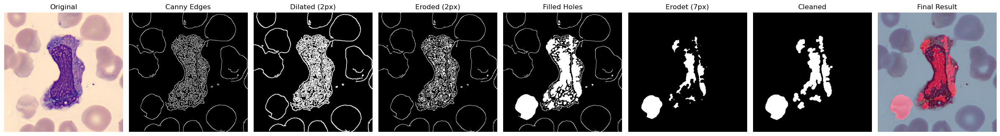

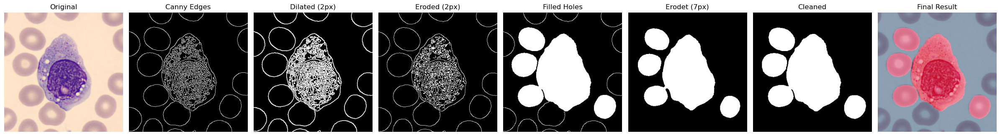

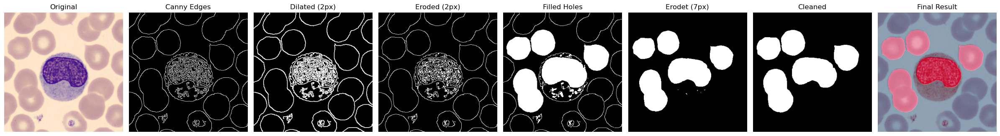

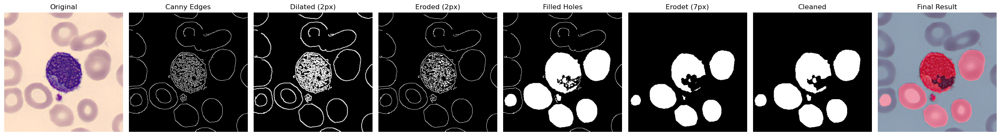

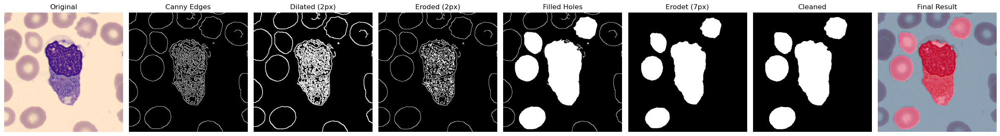

📌 Processing folder: neutrophil


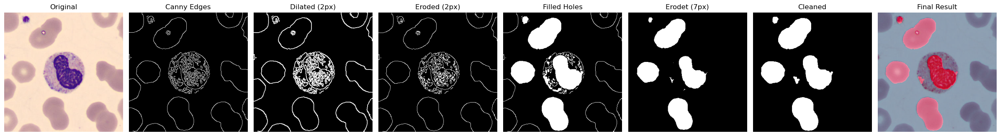

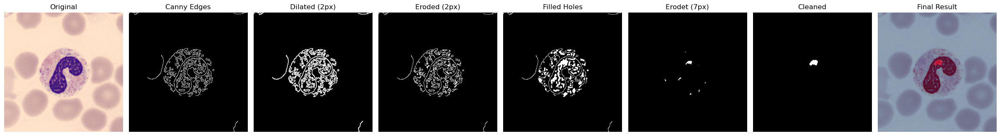

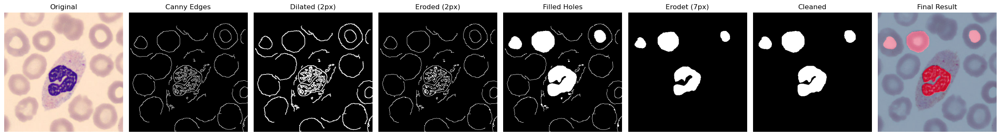

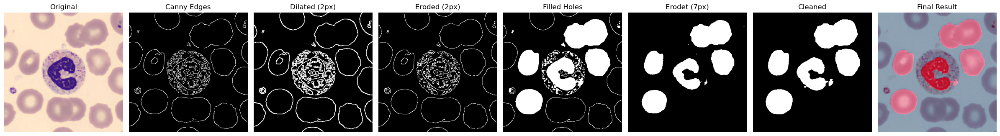

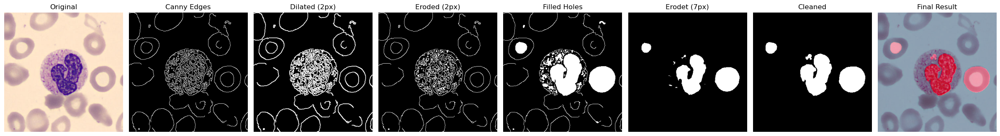

In [39]:
DATASET_PATH = "./segmented_dataset"   
process_dataset(DATASET_PATH)

In [40]:
def detail_segment_blood_cell(img_path):
    image = cv2.imread(img_path)
    if image is None:
        print(f"Error: Could not read the image at {img_path}")
        return None

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Step 1: Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Step 2: Apply Canny Edge Detection
    edges = cv2.Canny(gray, 30, 120)
    
    # Morphological Operations
    kernel_2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
    # Step 3: Dilasi Strel 2 piksel
    dilated_2 = cv2.dilate(edges, kernel_2, iterations=1)
    
    # Step 4: Erosi Strel 2 piksel
    eroded_2 = cv2.erode(dilated_2, kernel_2, iterations=1)
    
    # Step 5: Filling Holes
    filled = ndimage.binary_fill_holes(eroded_2).astype(np.uint8) * 255
    
    # Step 6: Erosi Strel 7 piksel
    kernel_7 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    eroded_7 = cv2.erode(filled, kernel_7, iterations=1)
    
    # Step 7: Dilasi Strel 6 piksel
    kernel_6 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (6, 6))
    dilated_6 = cv2.dilate(eroded_7, kernel_6, iterations=1)
    
    # Step 8: Remove small objects (< 150 pixels)
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(dilated_6, connectivity=8)
    mask = np.zeros_like(labels, dtype=np.uint8)
    for i in range(1, num_labels):  # Ignore background (label 0)
        if stats[i, cv2.CC_STAT_AREA] >= 150:
            mask[labels == i] = 255
    
    # Step 9: Final Segmentation Overlay
    segmentation_mask = np.zeros_like(image)
    segmentation_mask[mask > 0] = [255, 0, 0]  # Red highlight for better visibility
    final_result = cv2.addWeighted(image, 0.7, segmentation_mask, 0.4, 0)
    
    # Display results separately
    images = [image_rgb, gray, edges, dilated_2, eroded_2, filled, eroded_7, dilated_6, mask, final_result]
    titles = ["Original", "Grayscaling", "Deteksi Tepi Canny", "Dilasi (Strel = 2 Piksel)", "Erosi (Strel = 2 Piksel)", "Filling Holes Object", 
              "Erosi (Strel = 7 Piksel)", "Dilasi (Strel = 6 Piksel)", "Remove small objects (< 150 pixels)", "Final Result"]

    for i, img in enumerate(images):
        plt.figure(figsize=(6, 6))
        if len(img.shape) == 2:  # Grayscale
            plt.imshow(img, cmap='gray')
        else:  # RGB
            plt.imshow(img)
        plt.title(titles[i])
        plt.axis("off")
        plt.show()

    return mask


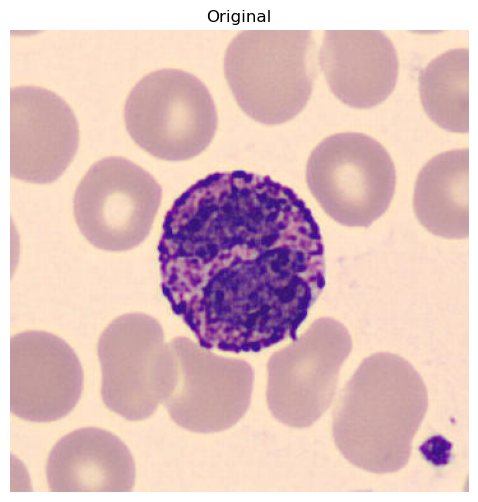

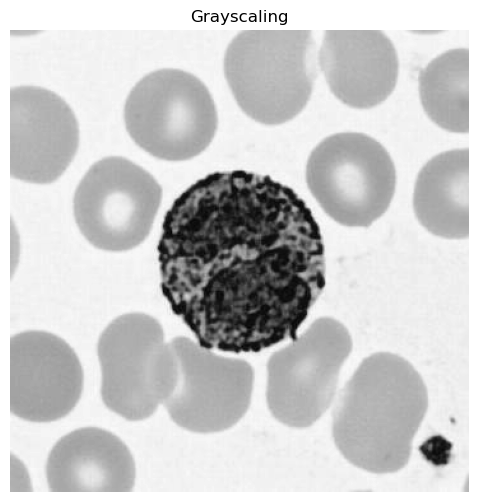

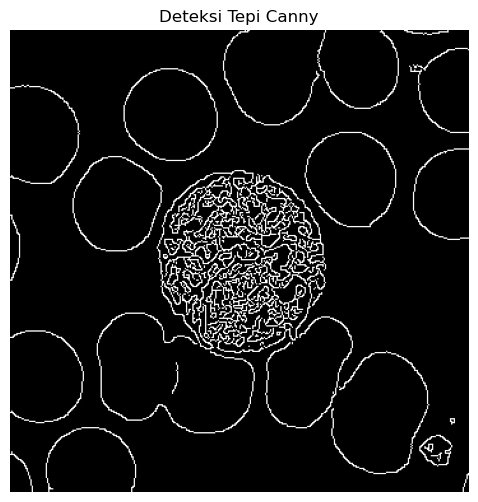

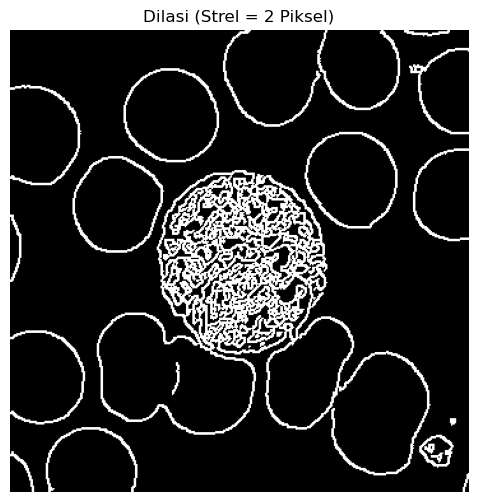

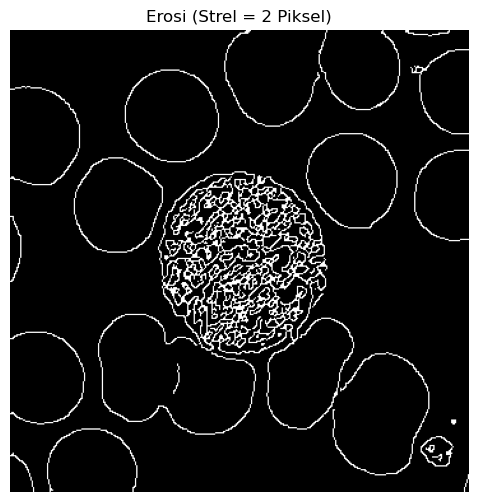

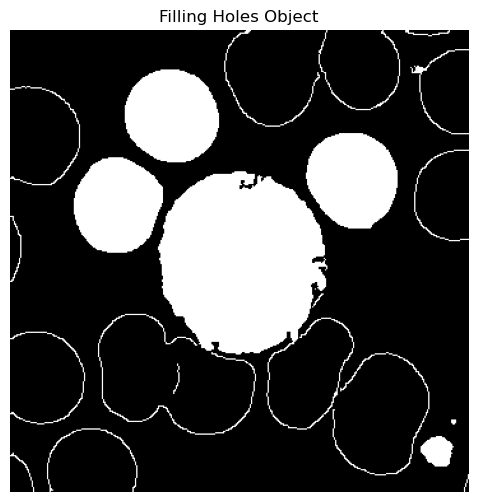

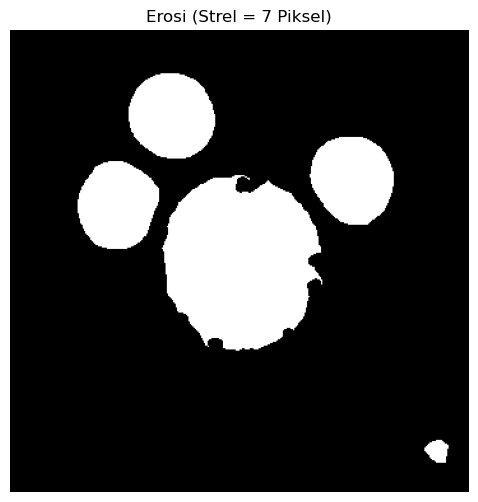

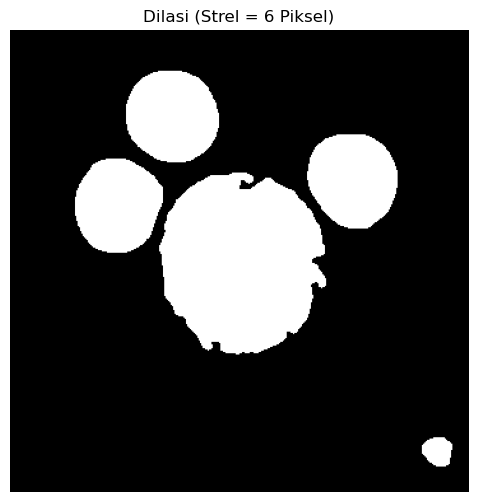

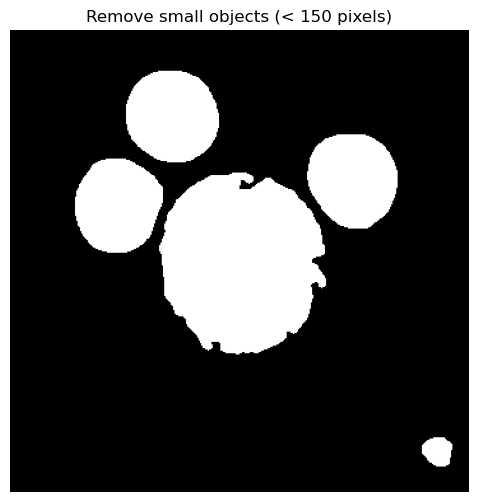

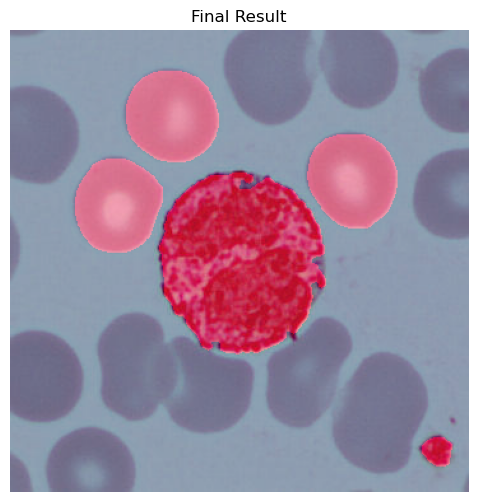

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [41]:
image_path = "./segmented_dataset/basophil/BA_101611.jpg"
detail_segment_blood_cell(image_path)